In [1]:
#label: cluster 1 = value: 0
#label: cluster 2 = value: 1
#label: cluster 3 = value: 2
#label: cluster 4 = value: 3
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import math
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop
from lime import explanation
from lime import lime_base
from lime_timeseries import LimeTimeSeriesExplainer


def x1_x2_x3_table(csv_file, class_start_date, class_end_date):
    df_uploaded = pd.read_csv(csv_file)
    class_start_date =  datetime.strptime(class_start_date , '%Y-%m-%d').date()
    class_end_date = datetime.strptime(class_end_date , '%Y-%m-%d').date()
    after_end = 196 - 28 - len(pd.date_range(class_start_date, class_end_date))
    new_index = pd.date_range(class_start_date - timedelta(days=28), class_end_date + timedelta(days=after_end))
    user = df_uploaded['get_user_ID'].unique()
    
    Table = {} 
    df_time_sum_minutes = pd.DataFrame(columns = new_index)
    df_time_sum_log = pd.DataFrame(columns = new_index)
    df_visits = pd.DataFrame(columns = new_index)
    
    for i in user:
        Table[i] = df_uploaded.loc[df_uploaded['get_user_ID'] == i]
        Table[i]['get_user_ID'] = Table[i]['get_user_ID'].astype(str)
        Table[i] = Table[i].replace('不足1s', '00:00:01')
        Table[i]['time_spent'] = pd.to_timedelta(Table[i].time_spent)
        Table[i]['visit_time'] = pd.to_datetime(Table[i].visit_time, format='%Y.%m.%d %H:%M')
        Table[i]['visit_date'] = Table[i]['visit_time'].dt.date
        Table[i] = Table[i].sort_values('visit_time')
        Table[i]['time_spent'] = Table[i]['time_spent'].dt.total_seconds()
        Table[i] = Table[i].groupby(['visit_date']).agg(time_sum = 
                                                         ('time_spent', 'sum'),
                                                         visits_count = 
                                                         ('visit_time', 'count')).reset_index()
        Table[i]['time_sum_log'] = np.log(Table[i]['time_sum']+1) 
        Table[i]['time_sum'] = Table[i]['time_sum']/60
        Table[i].set_index('visit_date', inplace=True)
        Table[i].index = pd.DatetimeIndex(Table[i].index)
        Table[i] = Table[i].reindex(new_index, fill_value=0)
        Table[i] = Table[i].transpose()
        
        df_time_sum_minutes.loc[str(i)] = Table[i].loc['time_sum']
        df_time_sum_log.loc[str(i)] = Table[i].loc['time_sum_log']
        df_visits.loc[str(i)] = Table[i].loc['visits_count']
    print(df_time_sum_minutes.isnull().sum().sum())
    print(df_time_sum_minutes.isin([np.inf, -np.inf]).sum().sum())  
    print(df_time_sum_log.isnull().sum().sum())
    print(df_time_sum_log.isin([np.inf, -np.inf]).sum().sum())  
    print(df_visits.isnull().sum().sum())
    print(df_visits.isin([np.inf, -np.inf]).sum().sum()) 
    
    scaler = MinMaxScaler()  
    df_time_sum_minutes_scaled = df_time_sum_minutes[:]
    df_time_sum_minutes_scaled = scaler.fit_transform(df_time_sum_minutes_scaled)    
    df_time_sum_minutes_scaled = pd.DataFrame(df_time_sum_minutes_scaled, index = df_time_sum_minutes.index, 
                                              columns = df_time_sum_minutes.columns)
    df_time_sum_log_scaled = df_time_sum_log[:]
    df_time_sum_log_scaled = scaler.fit_transform(df_time_sum_log_scaled)    
    df_time_sum_log_scaled = pd.DataFrame(df_time_sum_log_scaled, index = df_time_sum_log.index, 
                                              columns = df_time_sum_log.columns)
    df_visits_scaled = df_visits[:]
    df_visits_scaled = scaler.fit_transform(df_visits_scaled)    
    df_visits_scaled = pd.DataFrame(df_visits_scaled, index = df_visits.index, 
                                              columns = df_visits.columns)
    
    return df_time_sum_minutes_scaled, df_time_sum_log_scaled, df_visits_scaled


C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages

In [2]:
def y_table_fig(csv_file, class_start_date, class_end_date, cluster_n, cluster_coldict_n, PC_n=2):
    df_uploaded = pd.read_csv(csv_file)
    class_start_date =  datetime.strptime(class_start_date , '%Y-%m-%d').date()
    class_end_date = datetime.strptime(class_end_date , '%Y-%m-%d').date()
    user = df_uploaded['get_user_ID'].unique()
    
    Table = {}     
    Learners = {}
    
    for i in user:
        Table[i] = df_uploaded.loc[df_uploaded['get_user_ID'] == i]
        Table[i]['get_user_ID'] = Table[i]['get_user_ID'].astype(str)
        Table[i] = Table[i].replace('不足1s', '00:00:01')
        Table[i]['time_spent'] = pd.to_timedelta(Table[i].time_spent)
        Table[i]['visit_time'] = pd.to_datetime(Table[i].visit_time, format='%Y.%m.%d %H:%M')
        Table[i]['visit_date'] = Table[i]['visit_time'].dt.date
        Table[i] = Table[i].sort_values('visit_time')
        Table[i]['time_spent'] = Table[i]['time_spent'].dt.total_seconds()
        Table[i] = Table[i].groupby(['visit_date']).agg(time_sum = 
                                                         ('time_spent', 'sum'),
                                                         visits_count = 
                                                         ('visit_time', 'count')).reset_index()
        Table[i]['day_difference'] = Table[i].diff(periods=1, axis=0)['visit_date'].fillna(pd.Timedelta(days=0))  
        Table[i]['day_difference'] = Table[i]['day_difference'].apply(lambda x: x.days)
        Table[i]['time_spent_pv'] = Table[i]['time_sum']/Table[i]['visits_count']        
        Learners["LEARNER{0}".format(i)] = []
     
        sum_Q1 = Table[i]['time_sum'].quantile(0.25)
        sum_Q3 = Table[i]['time_sum'].quantile(0.75)
        sum_IQR = sum_Q3 - sum_Q1
        
        before_class = Table[i][(Table[i]['visit_date'] < class_start_date)]['time_sum']
        in_semester = Table[i].loc[(Table[i]['visit_date'] >= class_start_date)
                                   & (Table[i]['visit_date'] <= class_end_date)]['time_sum']
        after_class = Table[i][(Table[i]['visit_date'] > class_end_date)]['time_sum']
        
        if before_class.sum(axis=0) > 0:
            meta = 1
            in_moti_before = before_class.median()
        else: 
            meta = 0
            in_moti_before = 0
        
        if after_class.sum(axis=0) > 0:
            in_moti_after = after_class.median()
        else:
            in_moti_after = 0
                     
        half = round(Table[i].shape[0]/2)
        first_half = Table[i].loc[:half, 'time_sum'] 
        second_half = Table[i].loc[half:, 'time_sum']  
        
        #Six Character Features
        Grit = Table[i]['time_sum'].median() / sum_IQR
        Self_control = Table[i]['time_spent_pv'].median()
        Meta_cog_Self_reg = (meta + (Table[i]['day_difference'].isin(Table[i]['day_difference'].mode()).count()/(Table[i]['day_difference'].nunique()))) / sum_IQR
        Motivation = in_moti_before + in_semester.median() + in_moti_after
        Engagement = Table[i]['time_sum'].median()
        Self_perception = -math.log(1 + abs(first_half.median() - second_half.median()))
                
        Learners["LEARNER{0}".format(i)].extend([str(i), Grit, Self_control, Meta_cog_Self_reg, Motivation, Engagement, Self_perception])    
        
    Learners_col = ['user_ID', 'Grit', 'Self_control', 'Meta_cog_Self_reg', 'Motivation', 'Engagement', 'Self_perception']
    df_Learners = pd.DataFrame(columns = Learners_col)
    for i in user:
        a_series = pd.Series(Learners['LEARNER' + str(i)], index = df_Learners.columns)
        df_Learners = df_Learners.append(a_series, ignore_index=True)
    df_Learners.set_index('user_ID', inplace=True)
    df_Learners = df_Learners.astype(np.float64)
        
    print(df_Learners.isnull().sum().sum())
    print(df_Learners.isin([np.inf, -np.inf]).sum().sum())        
    scaler = MinMaxScaler()    
    df_Learners_scaled = df_Learners[:]
    df_Learners_scaled = scaler.fit_transform(df_Learners_scaled)    
    table = pd.DataFrame(df_Learners_scaled, index = df_Learners.index, 
                                          columns = df_Learners.columns)
    pca = PCA(n_components=PC_n, svd_solver = "full")
    pca_result = pca.fit_transform(table)
    df_Learners_scaled_PCA = table[:]
    for i in range(PC_n):
        df_Learners_scaled_PCA['PC' + str(i + 1)] = pca_result[:, i]
    df_PC = df_Learners_scaled_PCA.iloc[:, -PC_n:]
    kmeans = KMeans(n_clusters=cluster_n)
    kmeans.fit(df_PC)
    y_kmeans = kmeans.predict(df_PC)
    df_Learners_scaled_PCA['cluster'] = y_kmeans.astype(int)
    series_cluster = df_Learners_scaled_PCA.loc[: ,'cluster']
    
    fig, ax = plt.subplots(figsize=(22, 21))  #create a fig with 1 ax
    colors =cluster_coldict_n 
    PSGR=df_Learners_scaled_PCA['cluster'].apply(lambda x: colors[x])   
    x = df_Learners_scaled_PCA['PC1'].astype('float32')
    y = df_Learners_scaled_PCA['PC2'].astype('float32')
    
    for i in range(0, len(table.columns)): 
        ax.arrow(0,
                 0,  
                 pca.components_[0, i],  
                 pca.components_[1, i],  
                 head_width=0.01,
                 head_length=0.01)
        plt.text(pca.components_[0, i] + 0.01,
                 pca.components_[1, i] + 0.01,
                 table.columns[i],
                 fontstyle = 'italic', 
                 fontsize = 'large', 
                 color = 'slategray') 
    ax.spines['left'].set_position('zero')  
    ax.spines['bottom'].set_position('zero')  
    plt.axvline(0)  
    plt.axhline(0)          
    plt.scatter(x, y, c=PSGR, s=150, cmap='viridis')
    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='dimgray', s=600, alpha=0.5)
    cluster_list = ["cluster {0}".format(i+1) for i in range(cluster_n)]
    for i, txt in enumerate(cluster_list):
        plt.annotate(txt, (centers[i, 0], centers[i, 1]), color='black', fontsize=20)
    plt.axis('equal')
    plt.close()
        
    return series_cluster, fig


In [3]:
df_time_sum_minutes_scaled, df_time_sum_log_scaled, df_visits_scaled = x1_x2_x3_table(
    csv_file = 'CL10120192.csv', 
    class_start_date = '2020-02-23', 
    class_end_date = '2020-06-29')

C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0
0
0
0
0
0


In [4]:
series_cluster, fig1 = y_table_fig(csv_file = 'CL10120192.csv', 
                                   class_start_date = '2020-02-23', 
                                   class_end_date = '2020-06-29', 
                                   cluster_n = 4, 
                                   cluster_coldict_n = {0:'cornflowerblue', 1:'mediumaquamarine', 2:'khaki', 3:'tomato'})

C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


0
0


C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [5]:
def revised_model(df_time_sum_log_scaled, series_cluster):
    img_input = layers.Input(shape=(14, 14, 1))
    x = layers.Conv2D(8, 2, activation='relu')(img_input)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Conv2D(16, 2, activation='relu')(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Conv2D(32, 2, activation='relu')(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu')(x)
    output = layers.Dense(4, activation='sigmoid')(x)

    model = Model(img_input, output)
    model.compile(loss='sparse_categorical_crossentropy',    
                  optimizer=RMSprop(lr=0.001), 
                  metrics=['acc'])    
      
    tableX_reshaped = df_time_sum_log_scaled.values.reshape(97, 14, 14, -1)
    tableY_array = series_cluster.astype(int)
    
    model.fit(tableX_reshaped, tableY_array, batch_size=10, epochs=150)
    return model


revised_model_instance = revised_model(df_time_sum_log_scaled = df_time_sum_log_scaled, 
                                       series_cluster = series_cluster)


def revised_model_predict(series, model = revised_model_instance):
    series = np.array(series)
    prob_list = model.predict(np.expand_dims(series.reshape(14, 14, -1), axis=0))
    return np.squeeze(prob_list)

Epoch 1/150
97/97 [==============================] - 0s 5ms/step - loss: 1.3425 - acc: 0.4639
Epoch 2/150
97/97 [==============================] - 0s 380us/step - loss: 1.2900 - acc: 0.4948
Epoch 3/150
97/97 [==============================] - 0s 387us/step - loss: 1.2598 - acc: 0.4948
Epoch 4/150
97/97 [==============================] - 0s 401us/step - loss: 1.2482 - acc: 0.4948
Epoch 5/150
97/97 [==============================] - 0s 366us/step - loss: 1.2412 - acc: 0.4948
Epoch 6/150
97/97 [==============================] - 0s 449us/step - loss: 1.2339 - acc: 0.4948
Epoch 7/150
97/97 [==============================] - 0s 374us/step - loss: 1.2290 - acc: 0.4948
Epoch 8/150
97/97 [==============================] - 0s 415us/step - loss: 1.2299 - acc: 0.4948
Epoch 9/150
97/97 [==============================] - 0s 349us/step - loss: 1.2213 - acc: 0.4948
Epoch 10/150
97/97 [==============================] - 0s 394us/step - loss: 1.2202 - acc: 0.4948
Epoch 11/150
97/97 [=====================

97/97 [==============================] - 0s 350us/step - loss: 0.4307 - acc: 0.8969
Epoch 86/150
97/97 [==============================] - 0s 357us/step - loss: 0.3456 - acc: 0.9072
Epoch 87/150
97/97 [==============================] - 0s 329us/step - loss: 0.3930 - acc: 0.8557
Epoch 88/150
97/97 [==============================] - 0s 339us/step - loss: 0.3935 - acc: 0.8763
Epoch 89/150
97/97 [==============================] - 0s 350us/step - loss: 0.3559 - acc: 0.8969
Epoch 90/150
97/97 [==============================] - 0s 411us/step - loss: 0.3470 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 370us/step - loss: 0.3950 - acc: 0.8763
Epoch 92/150
97/97 [==============================] - 0s 339us/step - loss: 0.3030 - acc: 0.9175
Epoch 93/150
97/97 [==============================] - 0s 340us/step - loss: 0.2974 - acc: 0.9278
Epoch 94/150
97/97 [==============================] - 0s 360us/step - loss: 0.3145 - acc: 0.9175
Epoch 95/150
97/97 [=======================

In [6]:
def Character_Feature(studentid, num_features, df_time_sum_log_scaled, series_cluster, num_slices = 28): 
    table = df_time_sum_log_scaled[:]
    table['cluster'] = series_cluster.astype(int)
    explainer = LimeTimeSeriesExplainer(class_names=['Cluster1', 'Cluster2', 'Cluster3', 'Cluster4'])
    exp = explainer.explain_instance(table.loc[studentid].iloc[:-1], revised_model_predict, 
                                     num_features=num_features, num_samples=5000, num_slices=num_slices,
                                 replacement_method='total_mean')    #labels=None, top_labels=4
                                                                    #advice: set top_labels = cluster_n
    cluster = table.loc[studentid].iloc[-1:]
    exp_figure = exp.as_pyplot_figure(label = int(cluster))    #arg: label = desired label
    plt.close()
    print(np.array(exp.available_labels()).shape)
    print(exp.available_labels()[:5])
 
    series = pd.DataFrame(table.loc[studentid].iloc[:-1])
    pd.to_datetime(series.index)
    others = pd.DataFrame(table[(table['cluster'] != int(cluster))].iloc[:, :-1].mean())
    pd.to_datetime(others.index)
    values_per_slice = math.ceil(len(series) / num_slices)
    
    fig, ax = plt.subplots(figsize=(20, 28))
    plt.plot(series, color='cornflowerblue', label='Explained instance')
    plt.plot(others, color='silver', label='Mean of other class')
    plt.legend(loc='lower left')
    for i in range(num_features):
        feature, weight = exp.as_list(label = int(cluster))[i]    #arg: label = desired label
        print([feature, weight])
        start = feature * values_per_slice
        end = start + values_per_slice
        color = 'tomato' if weight < 0 else 'mediumaquamarine' 
        plt.axvspan(others.index[0] + timedelta(days = int(start)) , 
                    others.index[0] + timedelta(days = int(end)), 
                    color=color, alpha=abs(weight*20))
        ax.annotate(str(feature), (others.index[0] + timedelta(days = int(start)+2), 0.9),
                   color = 'grey', fontsize = 20)
    plt.close()
    return exp_figure, fig

In [7]:
exp_figure, fig2 = Character_Feature("3180300116", num_features = 10, df_time_sum_log_scaled = df_time_sum_log_scaled, series_cluster = series_cluster, num_slices = 28)

C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


[3 2 0 1]
(5000, 4)
[array([1.0218787e-02, 3.0602564e-04, 9.5842678e-10, 6.6254444e-07],
      dtype=float32), array([3.2472122e-03, 2.2744048e-02, 5.3828955e-04, 3.3212903e-08],
      dtype=float32), array([1.9463449e-03, 8.1963437e-03, 8.7895069e-07, 2.4173696e-07],
      dtype=float32), array([2.6495717e-02, 2.3997370e-03, 2.5310012e-04, 6.1070155e-06],
      dtype=float32), array([1.59722250e-02, 1.11494903e-02, 1.09004126e-04, 2.84989383e-05],
      dtype=float32)]
[21, 0.011694564965395386]
[19, 0.006780704625173671]
[17, 0.0061037914975027325]
[3, -0.004879917937081375]
[2, 0.0045440935370877275]
[4, -0.002824145040967076]
[10, -0.0017649425684623625]
[5, -0.001453169551604911]
[25, -0.0007909523850296629]
[9, 0.0006177543162508626]


C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


In [8]:
table = df_time_sum_log_scaled[:]
table['cluster'] = series_cluster
a = revised_model_predict(table.loc["3180300116"].iloc[:-1])
print(a)
b = series_cluster.loc["3180300116"]
print(b)
c = labels = np.argsort(a)
print(c)
class_names=['Cluster1', 'Cluster2', 'Cluster3', 'Cluster4']
print(class_names[b])

[3.2720444e-04 1.6867459e-02 7.3885280e-06 3.0267453e-09]
1
[3 2 0 1]
Cluster2


C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


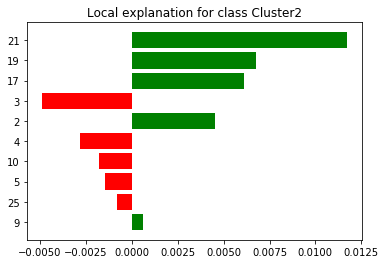

In [9]:
exp_figure

In [10]:
df_time_sum_log_scaled

,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,2020-02-01,2020-02-02,2020-02-03,2020-02-04,...,2020-07-30,2020-07-31,2020-08-01,2020-08-02,2020-08-03,2020-08-04,2020-08-05,2020-08-06,2020-08-07,2020-08-08
3190300856,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190300132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190301014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190300962,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190300799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3190300543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190300615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190300576,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3190300106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
series_cluster

user_ID
3190300856    1
3190300132    3
3190301014    2
3190300962    0
3190300799    3
             ..
3190300543    1
3190300615    0
3190300576    2
3190300106    2
3190300246    0
Name: cluster, Length: 97, dtype: int32

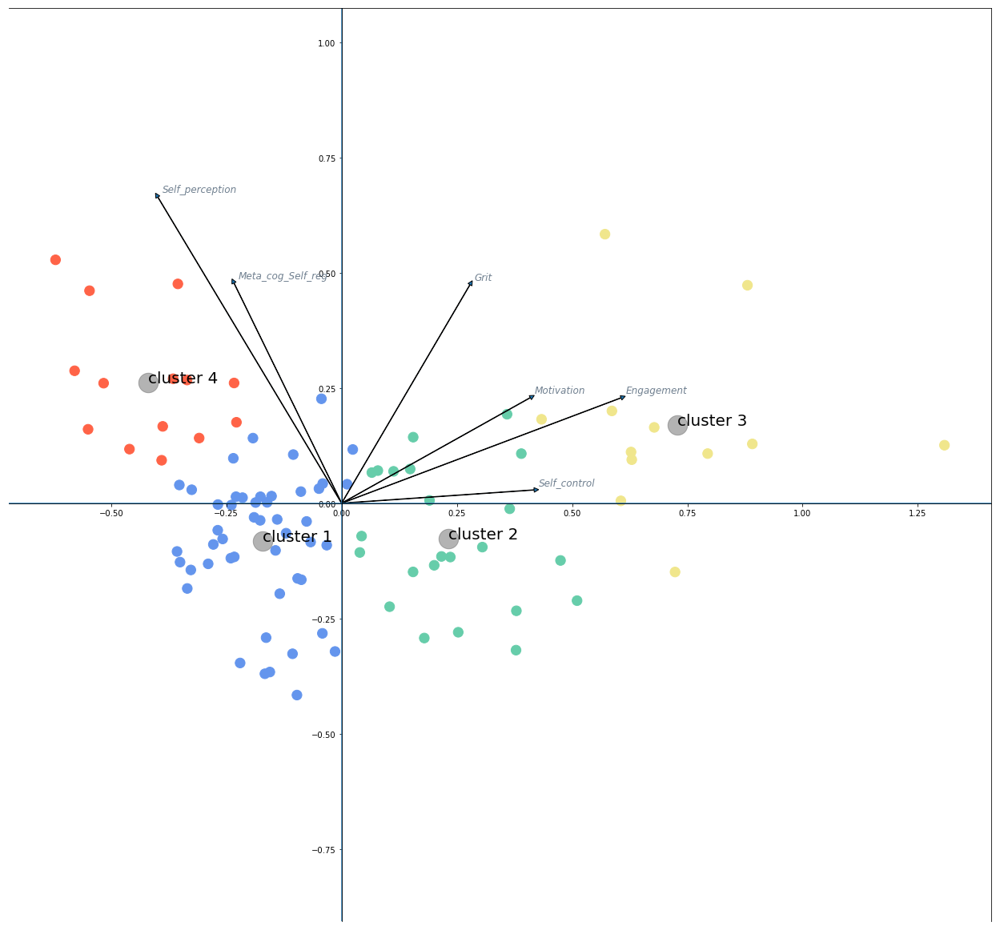

In [12]:
fig1

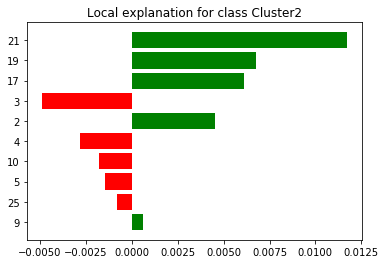

In [13]:
exp_figure

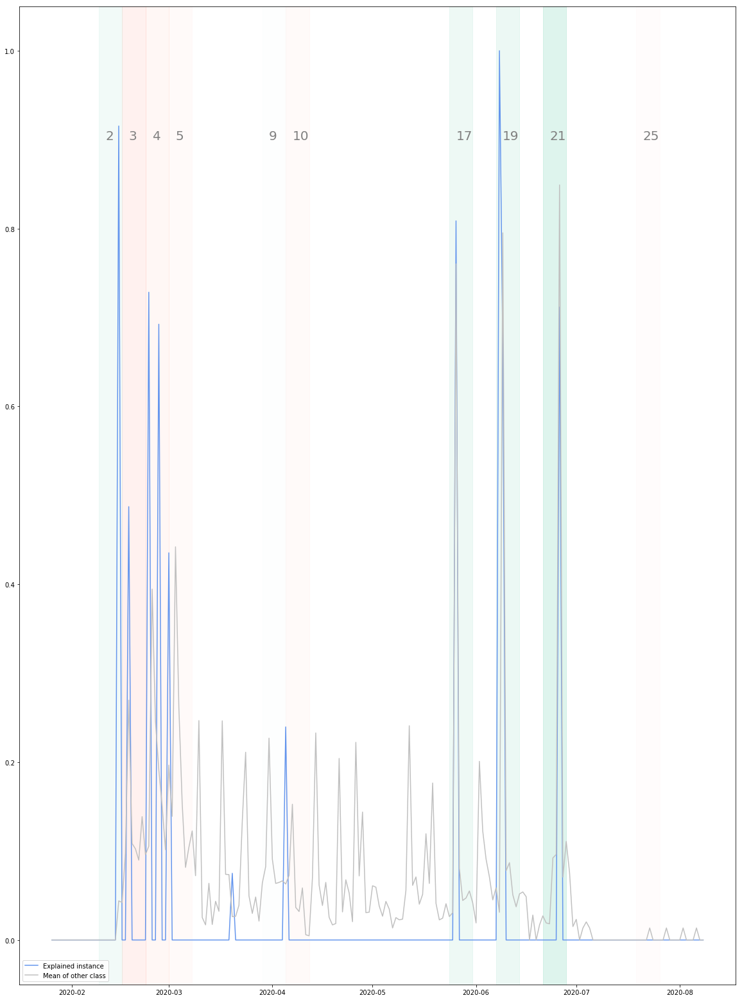

In [14]:
fig2

In [15]:
#label: cluster 1 = value: 0
#label: cluster 2 = value: 1
#label: cluster 3 = value: 2
#label: cluster 4 = value: 3
fig, axes = plt.subplots(4, 1, figsize=(150, 200))

table = df_time_sum_log_scaled[:]
table['cluster'] = series_cluster

for id in list(table.index):
    if table.loc[id, "cluster"] == 0:
        axes[0].plot(table.loc[id][:-1], 'cornflowerblue')
    elif table.loc[id, "cluster"] == 1:
        axes[1].plot(table.loc[id][:-1], 'mediumaquamarine')
    elif table.loc[id, "cluster"] == 2:
        axes[2].plot(table.loc[id][:-1], 'khaki')
    elif table.loc[id, "cluster"] == 3:
        axes[3].plot(table.loc[id][:-1], 'tomato')
plt.title('Time Series of Learning')
plt.show()

C:\Users\lawre\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
